In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt
from astropy.cosmology import FlatLambdaCDM
from astropy.units import Quantity
from astropy.table import Table

import slsim.Sources as sources
from slsim.ImageSimulation.image_quality_lenstronomy import kwargs_single_band
from slsim.ImageSimulation.image_simulation import rgb_image_from_image_list
from lenstronomy.SimulationAPI.sim_api import SimAPI

import warnings
warnings.filterwarnings("ignore")

%matplotlib inline

In [10]:
cosmo = FlatLambdaCDM(H0=70, Om0=0.3)
sky_area_quasar = Quantity(24.0, "deg2")

print("Loading pre-computed AGILE Quasar catalog...")
quasar_host_catalog = Table.read(f'../catalogs/agile_qsos.fits', format='fits')
print(f"Catalog loaded successfully. Total objects: {len(quasar_host_catalog)}")


quasar_host_catalog

Loading pre-computed AGILE Quasar catalog...
Catalog loaded successfully. Total objects: 14690


ps_mag_u,ps_mag_g,ps_mag_r,ps_mag_i,ps_mag_z,ps_mag_y,z,mag_u,mag_g,mag_r,mag_i,mag_z,mag_y,w0,w1,angular_size_0,angular_size_1,e0_1,e0_2,e1_1,e1_2,n_sersic_0,n_sersic_1,physical_size,black_hole_mass_exponent,log_L_bol,log_lambda_Edd
mag,mag,mag,mag,mag,mag,,mag,mag,mag,mag,mag,mag,,,arcsec,arcsec,,,,,,,kpc,,,
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64
20.344694355832186,20.100516232988927,19.74808117237122,19.734139102620553,19.69769378589522,19.53570023377086,1.0538777112960815,24.335005875452932,23.99059933419829,23.58811950737739,23.086240234552807,22.480760784733178,22.190382262519663,0.867277876827329,0.13272212317267099,0.30594924092292786,0.17215263843536377,-0.2566332044665686,-0.146260256746322,-0.46090987220422774,-0.2626815044671534,1.0,2.0,2.4791670110882205,7.3377487740959335,45.9335514819009,0.4954321626874023
26.578406305989034,25.746231042188157,25.527723704138012,25.319814792363353,25.037706532953244,24.78490144819248,2.371891975402832,29.277317650423903,27.04238303338788,26.170726554038165,25.729954413769224,25.38429536396262,25.007109453302874,0.9816476576957203,0.018352342304279772,0.5741918087005615,0.20241805911064148,-0.11705693313419521,-0.05085266065850358,-0.10211439833461515,-0.044361224131033605,1.0,2.0,4.684803176966269,6.980110808423868,44.57591841515982,-0.5045629383816124
30.243803953568786,29.914233495731043,29.782922984599256,29.861581607538163,29.765544027129913,29.710965606049022,0.8843787908554077,25.316655384919187,25.254778673940677,25.136268643537417,24.5905788254301,24.468934904804183,24.333088176623157,0.9971570438493281,0.002842956150671825,0.1143917366862297,0.021279077976942062,0.10211660807739795,0.2995030572777318,0.05980675705520378,0.17541031690284592,1.0,2.0,0.8867112799896986,4.440523067121883,41.613713431395745,-0.9271801808437017
23.600021362637637,22.87670392629782,22.59446487671214,22.544284505393005,22.32203134058478,22.158822021329687,2.5721309185028076,25.117573040786393,23.510471284993738,23.113690725781563,22.91085284348712,22.922162683803183,22.756841575098672,0.9742765766821061,0.02572342331789391,0.46181315183639526,0.29969537258148193,0.03161444490411162,-0.45528747060825764,0.03440287263785483,-0.495444310740053,1.0,2.0,3.704392620354286,7.217427801967883,45.63347294838,0.3156746012945568
27.095985115720502,26.723099694741105,26.71988135503599,26.54655536154023,26.698477072631107,26.40766268824798,0.5916422605514526,26.02013891750699,25.60273584499118,24.719307192024278,24.248337805599416,24.14448295665501,24.001362128767813,0.951146433221824,0.04885356677817596,0.25850507616996765,0.03483652323484421,-0.20959248985775566,-0.10410924642389473,-0.06143307301300396,-0.03051517228135682,1.0,2.0,1.7169638004442542,4.368616307996224,42.60215098282475,0.13316412971096536
21.351439555995526,21.218572806886055,21.017061207145208,21.046148362789385,21.137806071613504,21.008210361566853,1.1547247171401978,24.017952310060103,23.367512758635566,22.59297685848688,21.957170932344525,21.02939321471279,20.665551266206478,0.9146704909412077,0.0853295090587923,0.6917104125022888,0.7701387405395508,-0.10522825430769825,0.06382528006055485,-0.1230559622912766,0.074638520880482,1.0,2.0,5.702336928313312,7.719273918682436,45.38063541676446,-0.4390090470355368
21.862587880402394,21.54089269348126,21.107516439583378,20.734506509449425,20.426583974836884,20.385787871171768,2.037015676498413,22.83431148433893,22.43428098833251,22.31972429053579,22.374740033391102,22.277094481021614,22.224098715017174,0.9196565251635391,0.08034347483646083,0.31796813011169434,0.141405388712883,0.08963393847919437,-0.6706498731524358,0.0577006697897038,-0.4317220411357656,1.0,2.0,2.6561328252971337,6.476029899270813,46.30149716378383,1.7250967193954523
20.701101858204595,20.607030401072546,20.37885639064775,20.448699210024742,20.4342565

In [ ]:
kwargs_source_quasar_cut = {"band": "i", "band_max": 26, "z_min": 0.01, "z_max": 5.0}

# Initialize the unlensed quasar population
source_quasar_host_pop = sources.PointPlusExtendedSources(
    point_plus_extended_sources_list=quasar_host_catalog, 
    cosmo=cosmo, 
    sky_area=sky_area_quasar, 
    point_source_type="quasar", 
    extended_source_type="double_sersic", 
    kwargs_cut=kwargs_source_quasar_cut
)

In [11]:
def simulate_unlensed_quasar_band(
    source_obj, 
    band="i", 
    num_pix=41, 
    coadd_years=1, 
    observatory="LSST",
    with_source=True,
    with_point_source=True
):
    """
    Simulates a single unlensed quasar (Extended Host + Point Source AGN) 
    in a specific band, bridging physical magnitudes to simulated counts.
    
    Parameters:
    - with_source (bool): If True, renders the extended host galaxy.
    - with_point_source (bool): If True, renders the central AGN point source.
    """
    # 1. Fetch observatory noise and PSF configurations
    obs_kwargs = kwargs_single_band(band=band, observatory=observatory, coadd_years=coadd_years)
    
    # 2. Extract light profiles and magnitudes from the slsim Source object
    host_model_list, host_kwargs_mag = source_obj.kwargs_extended_light(band=band)
    agn_mag = source_obj.point_source_magnitude(band=band)
    
    # Ensure point source magnitude is a flat scalar
    if isinstance(agn_mag, np.ndarray) and agn_mag.size > 0:
        agn_mag = agn_mag[0] 
        
    # Center the extended host at the center of the image (0, 0)
    for kw in host_kwargs_mag:
        kw['center_x'] = 0.0
        kw['center_y'] = 0.0
        
    # 3. Build lenstronomy model structure
    # We assign the host to the lens_light_model to bypass ray-tracing
    kwargs_model = {
        'lens_light_model_list': host_model_list,  
        'point_source_model_list': ['UNLENSED']
    }
    kwargs_ps_mag = [{'ra_image': [0.0], 'dec_image': [0.0], 'magnitude': [agn_mag]}]
    
    # 4. Use SimAPI to handle noise and magnitude-to-amplitude conversions
    sim_api = SimAPI(numpix=num_pix, kwargs_single_band=obs_kwargs, kwargs_model=kwargs_model)
    
    kwargs_lens_light, _, _ = sim_api.magnitude2amplitude(kwargs_lens_light_mag=host_kwargs_mag)
    _, _, kwargs_ps = sim_api.magnitude2amplitude(kwargs_ps_mag=kwargs_ps_mag)
    
    # 5. Generate pristine image and add observation noise
    imSim = sim_api.image_model_class(kwargs_numerics={'supersampling_factor': 1})
    
    # Map the toggles to the lenstronomy ImageModel arguments
    image = imSim.image(
        kwargs_lens_light=kwargs_lens_light, 
        kwargs_ps=kwargs_ps,
        lens_light_add=with_source,        # Renders the host galaxy
        point_source_add=with_point_source # Renders the AGN
    )
    
    image += sim_api.noise_for_model(model=image)
    
    return image

## With Host Galaxy

Drawing 300 unlensed quasars from the population...
Simulation complete. Plotting...


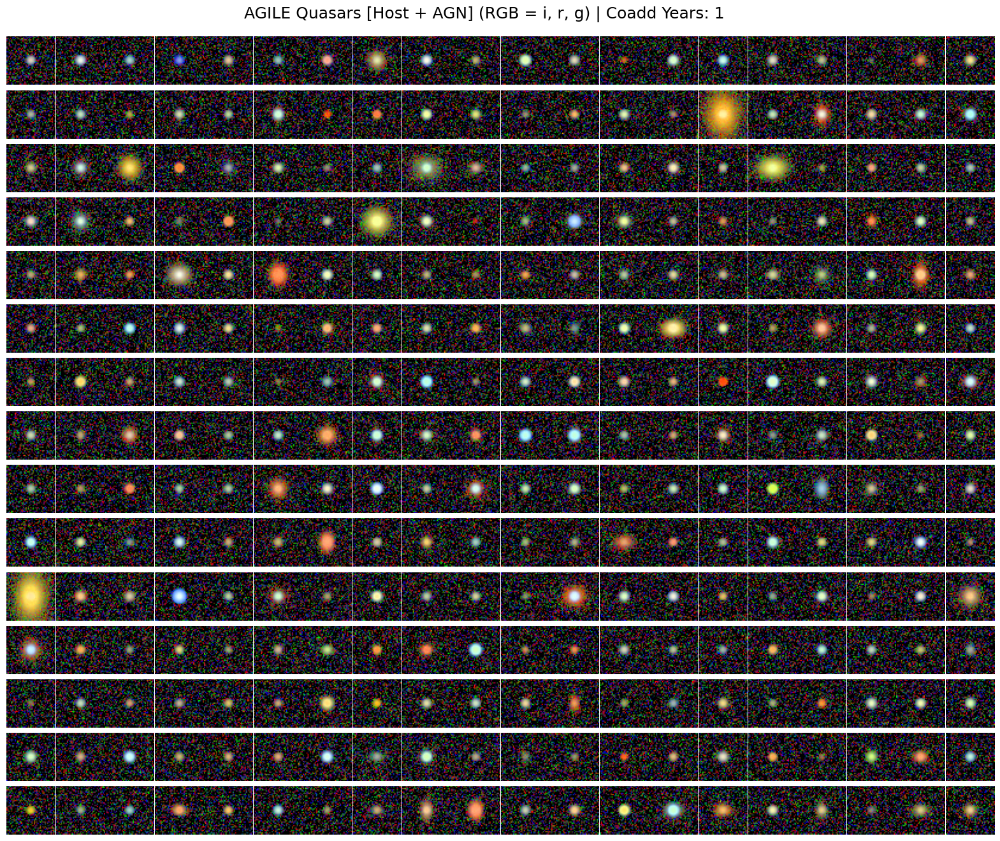

In [13]:
NUM_TO_SIMULATE = 300
COADD_YEARS = 1
NUM_COLS = 20
RGB_BANDS = ["i", "r", "g"]

print(f"Drawing {NUM_TO_SIMULATE} unlensed quasars from the population...")

rgb_images = []
for _ in range(NUM_TO_SIMULATE):
    # Sample a physical source object from the AGILE catalog wrapper
    source_obj = source_quasar_host_pop.draw_source()
    
    # Simulate each requested band
    band_images = []
    for b in RGB_BANDS:
        img = simulate_unlensed_quasar_band(source_obj, band=b, coadd_years=COADD_YEARS, with_source=True, with_point_source=True)
        band_images.append(img)
        
    # Merge into a stretched RGB array
    rgb = rgb_image_from_image_list(band_images, stretch=0.5)
    rgb_images.append(rgb)

print("Simulation complete. Plotting...")

# Build the grid plot
num_rows = int(np.ceil(NUM_TO_SIMULATE / NUM_COLS))
fig, axes = plt.subplots(num_rows, NUM_COLS, figsize=(NUM_COLS, num_rows))

for i, ax in enumerate(axes.flat):
    if i < len(rgb_images):
        ax.imshow(rgb_images[i], origin="lower")
    ax.axis("off")

plt.subplots_adjust(wspace=0.02, hspace=0.02, top=0.95)
plt.suptitle(f"AGILE Quasars [Host + AGN] (RGB = i, r, g) | Coadd Years: {COADD_YEARS}", fontsize=18)
plt.show()

## Without Host Galaxy

Drawing 300 unlensed quasars from the population...
Simulation complete. Plotting...


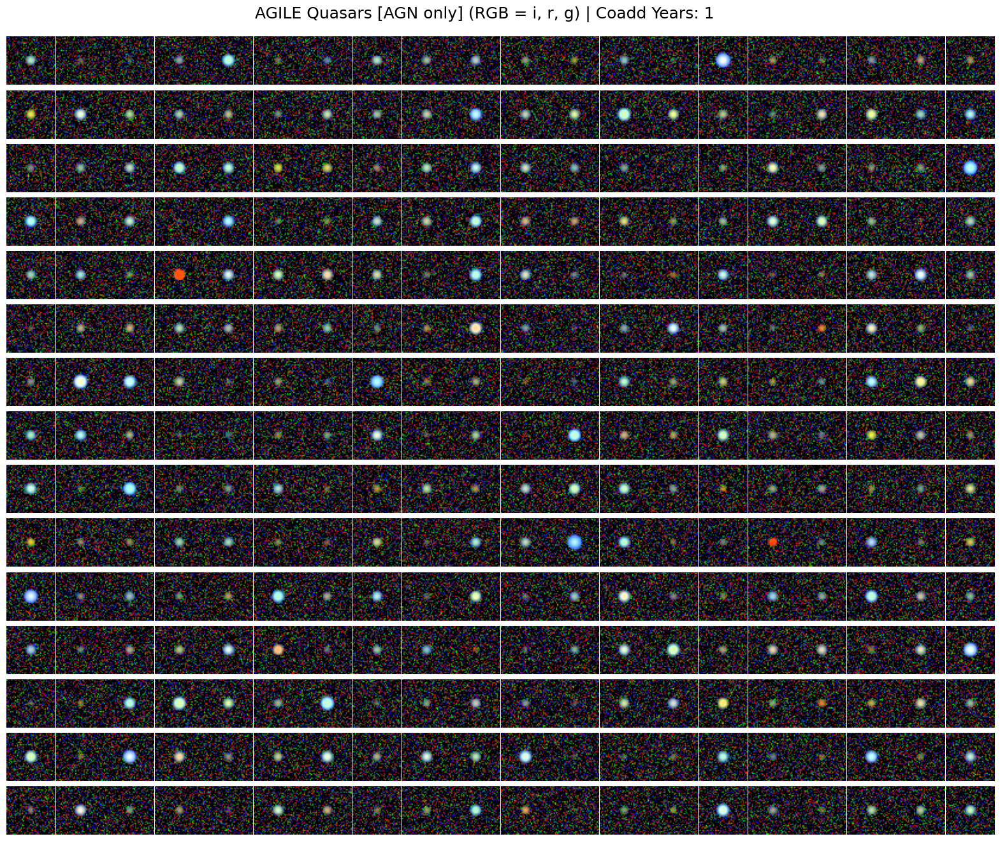

In [16]:
NUM_TO_SIMULATE = 300
COADD_YEARS = 1
NUM_COLS = 20
RGB_BANDS = ["i", "r", "g"]

print(f"Drawing {NUM_TO_SIMULATE} unlensed quasars from the population...")

rgb_images = []
for _ in range(NUM_TO_SIMULATE):
    # Sample a physical source object from the AGILE catalog wrapper
    source_obj = source_quasar_host_pop.draw_source()
    
    # Simulate each requested band
    band_images = []
    for b in RGB_BANDS:
        img = simulate_unlensed_quasar_band(source_obj, band=b, coadd_years=COADD_YEARS, with_source=False, with_point_source=True)
        band_images.append(img)
        
    # Merge into a stretched RGB array
    rgb = rgb_image_from_image_list(band_images, stretch=0.5)
    rgb_images.append(rgb)

print("Simulation complete. Plotting...")

# Build the grid plot
num_rows = int(np.ceil(NUM_TO_SIMULATE / NUM_COLS))
fig, axes = plt.subplots(num_rows, NUM_COLS, figsize=(NUM_COLS, num_rows))

for i, ax in enumerate(axes.flat):
    if i < len(rgb_images):
        ax.imshow(rgb_images[i], origin="lower")
    ax.axis("off")

plt.subplots_adjust(wspace=0.02, hspace=0.02, top=0.95)
plt.suptitle(f"AGILE Quasars [AGN only] (RGB = i, r, g) | Coadd Years: {COADD_YEARS}", fontsize=18)
plt.show()